In [42]:
import matplotlib.pyplot as plt
import numpy as np
from pst import PST_model
from random import randint

We want to learn event transitions in train chain and detect anomaly transitions in test chain

# Create model

Create random chain

In [61]:
chain = [f"event{randint(1, 10)}" for x in range(1_000_000)]
chain[:5]

['event10', 'event10', 'event3', 'event7', 'event9']

Create train-test chain

In [62]:
X_train = chain[:-len(chain)//5]
X_test = chain[-len(chain)//5:]

Create PST model

In [63]:
model = PST_model(5) # 5 - tree depth 

In [64]:
model.fit(X_train)

Number of created trees

In [65]:
len(model.trees)

10

In [66]:
for tree in model.trees:
    print(f"name: {tree.name}, depth: {tree.depth}, power: {tree.power}")

name: event10, depth: 5, power: 79809
name: event3, depth: 5, power: 79453
name: event7, depth: 5, power: 79821
name: event9, depth: 5, power: 80060
name: event8, depth: 5, power: 80353
name: event5, depth: 5, power: 80365
name: event1, depth: 5, power: 80095
name: event6, depth: 5, power: 80101
name: event4, depth: 5, power: 80321
name: event2, depth: 5, power: 79607


Visualize one of the created tree

In [67]:
model.trees[0].plot_PST_graph() 

Plot event probability in train chain

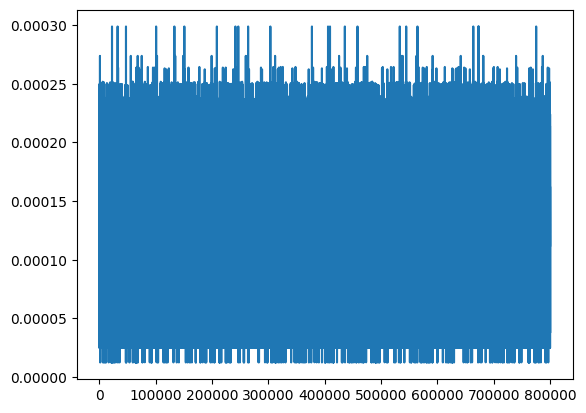

In [68]:
plt.plot(model.get_chain_prob(X_train))

Plot event probability in test chain

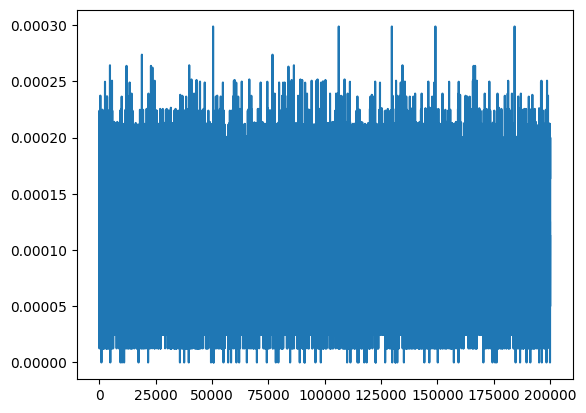

In [69]:
plt.plot(model.get_chain_prob(X_test))

Plot event probability in test chain with 0 probability as anomaly

In [70]:
anomaly_idx = np.where(np.array(model.get_chain_prob(X_test))==0)[0]
anomaly_idx

array([   968,   4902,   9415,  10110,  11019,  17423,  21664,  35786,
        37654,  39696,  49566,  50638,  50820,  55095,  57172,  58463,
        60834,  62045,  65470,  69926,  74320,  78303,  79437,  84659,
        88923,  91021,  91217,  95894,  98269, 109933, 111402, 114572,
       115036, 117518, 118593, 122574, 122667, 126806, 126818, 129947,
       131329, 131412, 132185, 135122, 144184, 146388, 150145, 157280,
       159339, 170371, 174416, 175558, 176226, 184657, 186647, 189520,
       191190, 195088, 196305, 198363, 199924], dtype=int64)

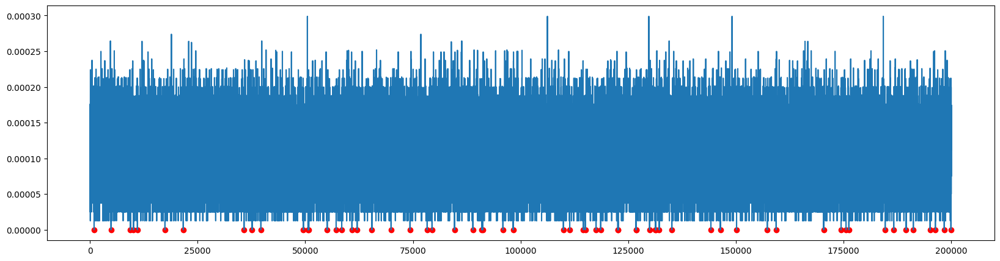

In [71]:
plt.figure(figsize=(20,5))
plt.plot(model.get_chain_prob(X_test))
plt.scatter(anomaly_idx, [0 for _ in anomaly_idx], color='red')
plt.show()